
<img src="https://univ-cotedazur.fr/medias/fichier/uca-logo-large_1594376453664-?ID_FICHE=20419&INLINE=FALSE" width="200">


**MSc DSAI 2022 - Graph Neural Network LAB SESSION**

## **GRAPH NEURAL NETWORKS - Laboratory Session**


#### Lab proposed by:
------------------------------------------------


### Marco Gori
Full Professor at Universite Cote d'Azur and University of Siena (SAILab)

 
marco.gori@unisi.it / 
[web page](https://sailab.diism.unisi.it/people/marco-gori/)

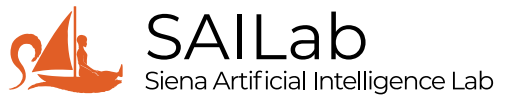

### Matteo Tiezzi, PostDoctoral Researcher @ SAILab


mtiezzi@diism.unisi.it / [web page](http://mtiezzi.github.io/)


#### Gabriele Ciravegna, PhD Student @ SAILab


gabriele.ciravegna@unifi.it / [web page](http://sailab.diism.unisi.it/people/gabriele-ciravegna/)





Figure credits to Petar Veličković, Wang, X. et al. “Efficient Metropolitan Traffic Prediction Based on Graph Recurrent Neural Network.”, "Chemical graph generators" by Mehmet Aziz Yirik et al., DeepMind, Xavier Bresson

## Warming up

***DON'T FORGET TO WORK ON A COPY OF THIS NOTEBOOK***



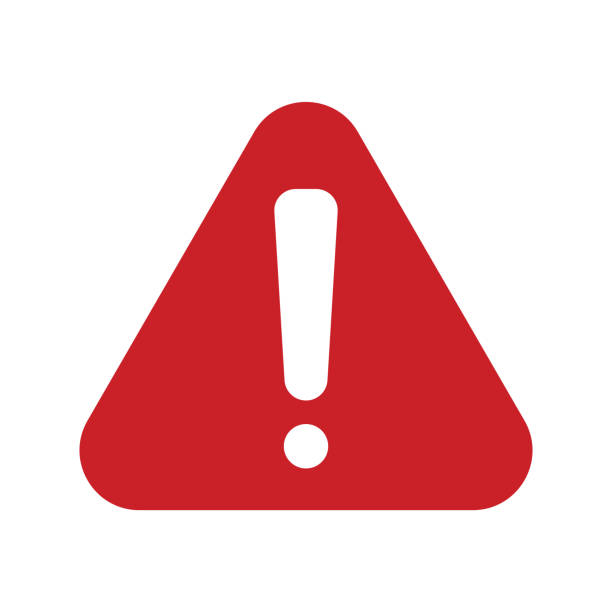

## Overview

The laboratory on GNNs is composed of three parts, with the following contents:
 

1.   Introduction on the session, ubiquity of structured data and graph handling. Utility of GNNs and brief intro.
2.   [The original GNN model ](https://ieeexplore.ieee.org/document/4700287), the GNN framework in PyTorch
3.   Other GNN models (GCN and others), GNN frameworks and Deep Graph Library (DGL) usage



# PART I - Introduction and how to handle graphs

### Ubiquity of graph data
Physicochemical Molecule Behaviour  
<img src="https://journals.plos.org/ploscompbiol/article/file?id=10.1371/journal.pcbi.1008504.g003&type=large" height="200">


Traffic Congestion (Estimated Time of Arrival)

<img src="https://d3i71xaburhd42.cloudfront.net/9e2b695d3b6952e4413df659ffdd0f8fb584bcca/2-Figure3-1.png" height="200">


Social Networks Analysis

<img src="https://www.policechiefmagazine.org/wp-content/uploads/Remote-Networking-825x510.jpg" height="200">










### Several real-world usages 
[See the recent slides by Xavier Bresson.](https://www.dropbox.com/s/u82gcg3aath39hp/GNN_applications_Jun21.pdf?dl=0)

- Chip Design
- Combinatorial Optimization
- Scene Reasoning
- Recommendation
- Fake News Detection
- Natural Language Processing
- Knowledge Graphs
- Transportation
- Autonomous Driving
- Protein Folding & Drug Design
- Energy Physics & Simulations

## How to handle Graph data

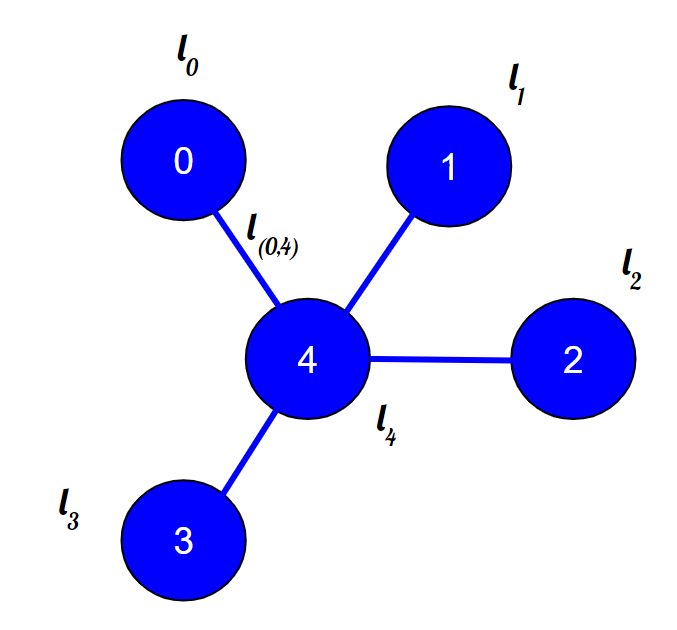


 Graph $G=(V,E)$, where $V$ is a finite set of **nodes** and $E \subseteq V \times V$ collects the **arcs**


Each node could be enriched by some attributes characterizing its properties and nature. In this case, we can talk of an *attributed* graph.  Examples of node features: 

*   Physicochemical characteristics in molecules
*   user preferences in recommendation systems
*   user profile in social networks
*   additionally, when the graph is non-attributed, we can specify some node identifiers 

Specified by:

 $l_i$  node $i$  features $\rightarrow$ global feature matrix $X$ -- (with dimension $N \times d$ if $N$ is the total  nodes number, one row per node, $d$-dimensional features).

Also arcs can be characterized by features:
 
 $l_{(i,j)}$ arc $(i,j)$ features





## [NetworkX](https://networkx.org/)  - https://networkx.org/

*NetworkX is a Python package for the creation, manipulation, and study of the structure, dynamics, and functions of complex networks*

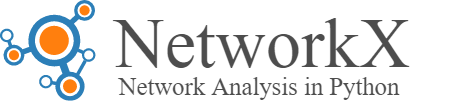

In [1]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

### Graph as Edge List
A graph can be represented through  a list of `[source, destination]` pairs, an **edge-list**.

In [2]:
E = np.asarray([[0,4],
                [1,4],
                [2,4],
                [3,4]])

In [3]:
E

array([[0, 4],
       [1, 4],
       [2, 4],
       [3, 4]])

We can give such list `E` as an input to the Networkx Graph class `nx.Graph()` -  the following snippet contains the graph creation and plotting using a common layout (spring).

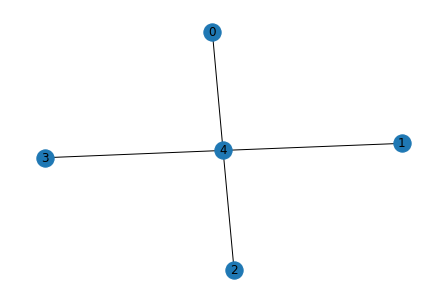

In [4]:
G = nx.Graph()
G.add_nodes_from(range(5)) # node indices
G.add_edges_from(E) # edge list given as input to the graph G
nx.draw_spring(G, cmap=plt.get_cmap('Set1'), with_labels=True)
plt.show()


### Adjancency Matrix

The  Adjancency Matrix is compact way in which is possible to describe the graph topology. It consists in a square matrix ($N \times N$) which elements indicate whether pairs of vertices are adjacent or not in the graph.

$a_{i,j} = \begin{cases} 1 & (i, j) \in E \\
0  & \text{else}
\end{cases}
$

In [5]:
A = nx.adjacency_matrix(G)
print(A.todense())

[[0 0 0 0 1]
 [0 0 0 0 1]
 [0 0 0 0 1]
 [0 0 0 0 1]
 [1 1 1 1 0]]


In [6]:
print(A)

  (0, 4)	1
  (1, 4)	1
  (2, 4)	1
  (3, 4)	1
  (4, 0)	1
  (4, 1)	1
  (4, 2)	1
  (4, 3)	1


### Other Example

Another  graph example.

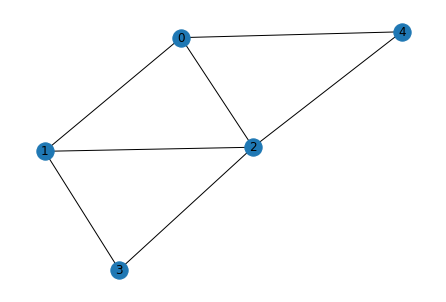

[[0 1 1 0 1]
 [1 0 1 1 0]
 [1 1 0 1 1]
 [0 1 1 0 0]
 [1 0 1 0 0]]


In [7]:
E2 = np.asarray([[0, 1 ], [0,2 ], [0, 4 ], [1, 2 ], [1, 3 ], [2, 3 ], [2, 4 ]])
G2 = nx.Graph()
G2.add_nodes_from(range(5)) # node indices
G2.add_edges_from(E2) # edge list
nx.draw_spring(G2, cmap=plt.get_cmap('Set1'), with_labels=True)
plt.show()
A2 = nx.adjacency_matrix(G2)
print(A2.todense())

## Node attributes

We can specify the node attributes using a $N \times d$ matrix, where $d$ is the node feature dimension. The following snippet contains the node feature definition as one-hot codes (each node is identified by a different one-hot code). 



In [8]:
#node features
X = np.eye(4)
print(X)

[[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]


## Part I.a - Graph Neural Networks



*  Traditional machine learning approaches assume to deal with **flat data**
*  Flat representations relying on summary graph statistics,  kernel functions, graph traversals procedures etc.

*  *Pre-processing step*, using hand-engineered statistics to extract structural information into simpler encodings
*   Limited approaches -- loosing useful information, not able to adapt during learning






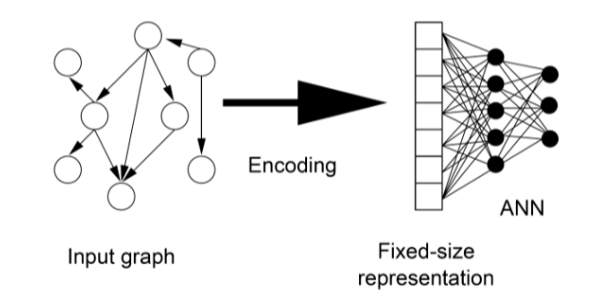

### GNNs 


1.  No need of a preprocessing embedding step
2.  No limitation on the graph type
3.  Neural networks exploited to learn how to encode nodes of a graph for a given task
4.  Take into account information local to each node and the whole graph topology




### Timeline of GNN models



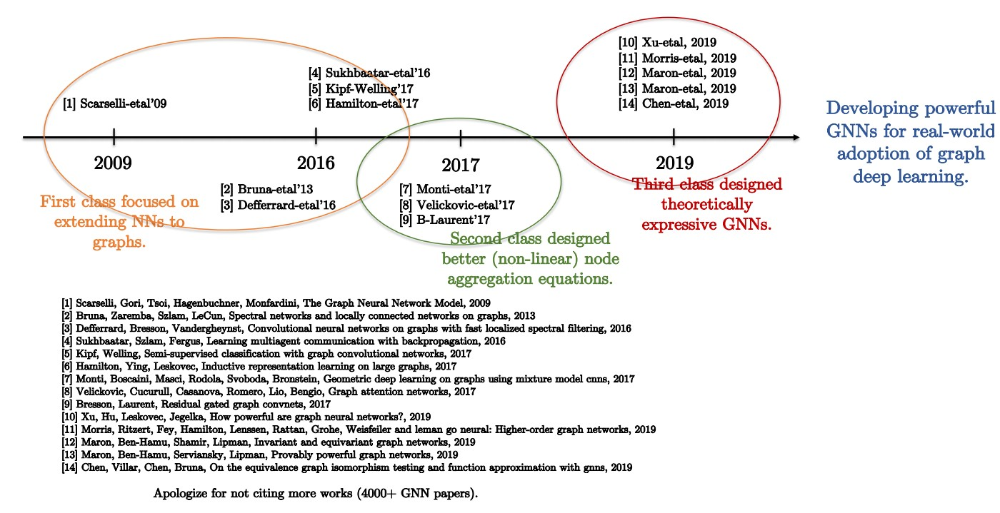

[A Comprehensive Survey on Graph Neural Networks](https://arxiv.org/pdf/1901.00596.pdf)

###  A usefull (and powerfull) paradigm: Message Passing Models
It is the most powerfull and generic model description of GNNs. Based on message exchange among neighbors. Many GNN models can be described using this formalism. It helps understanding how the information propagates inside the graph.



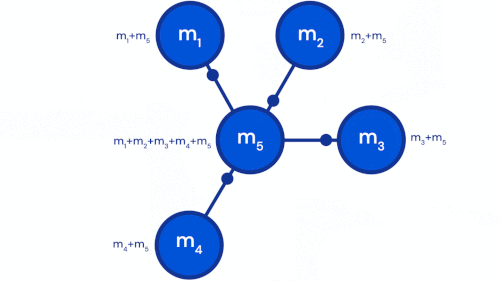

#### Learning Tasks - Using the GNN outputs

Given an input graph (or graph dataset), GNNs can attack various types of tasks.



*   **Node classification** - produce an output class for each node in the processed graph  (atom level in a molecule )
*   **Graph classification** - produce a single output for the whole graph 
*   **Link prediction** - predict wheter there is an arc between two unseen nodes



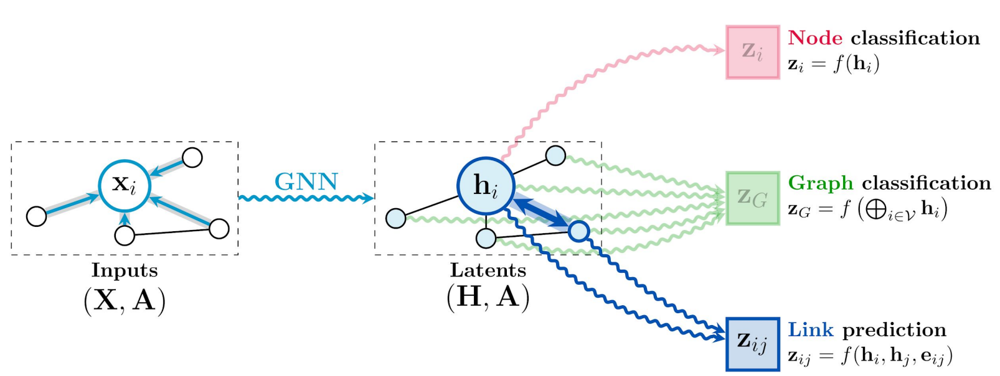

### Learning and inference schemes












#### **Transductive**

Models such as Graph Convolutional Nets (GCNs) where initially introduced in the Transductive setting:  process nodes from a single fixed graph, with some training nodes (a subset of the overall graph) and the remaining validation/testing nodes. 


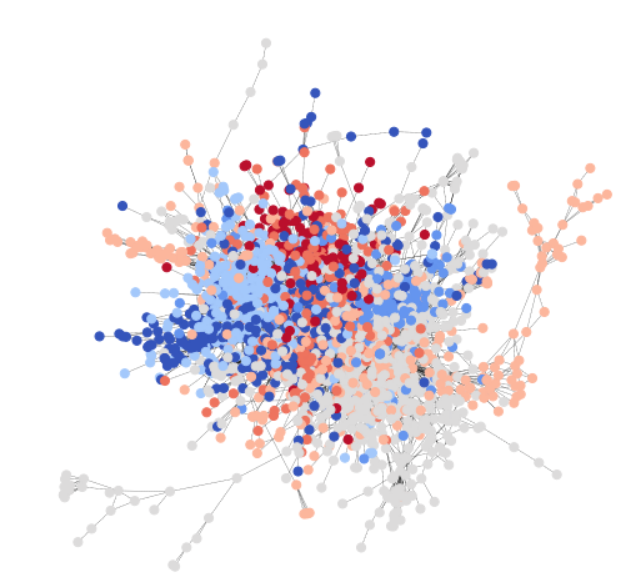




#### **Inductive**
GNNs can be used for  classical inductive learning scheme, where a training set is used to adapt a parametric model.
Actually, inductive learning assumes the existence of some rules, that can be
implemented by the model, allowing us to classify a pattern given its properties.

The GNN model learns on the training data (a set of graphs) and afterwards is capable to do inference on previously unseen graphs (validation and test).


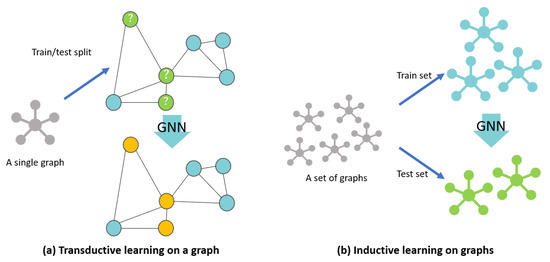

[Figure credit](https://www.mdpi.com/2220-9964/10/2/97/htm)

#### Available Frameworks 
Avoid the boiler plate of model implementation, they provide many ready to use  GNN models (in Tensorflow, PyTorch, etc.)

- [GNN Framework ](http://sailab.diism.unisi.it/gnn/)
- [Deep Graph Library ](https://www.dgl.ai/)
- [PyTorch Geometric ](https://pytorch-geometric.readthedocs.io/en/latest/)


And many others!

## Available Datasets


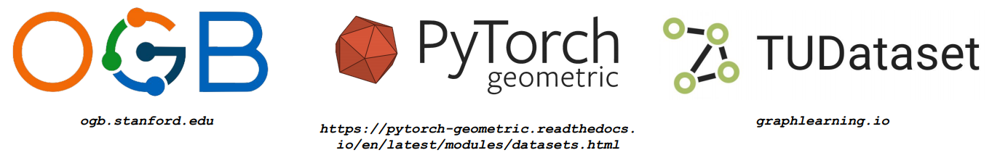

# Part II - The Graph Neural Network Model (RecGNNs)

## [The Graph Neural Network Model  ](https://ieeexplore.ieee.org/document/4700287)

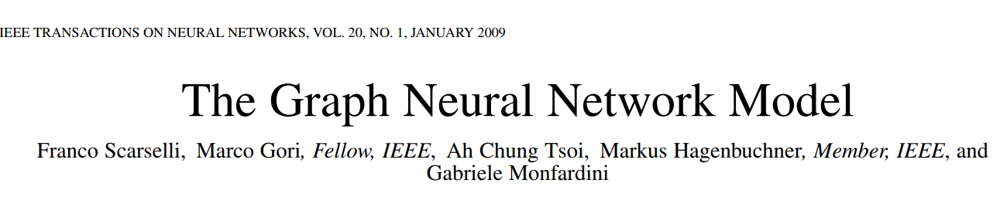



- No need of a preprocessing embedding step (w.r.t graph encoding techniques)
- No limitation on the graph type (more general w.r.t Recursive nets)

- ***Neural networks exploited to learn how to encode nodes of a graph for a given task*** 
- Take into account information **local to each node** and the **whole graph topology**
 
- The learning process requires, for each epoch, an iterative  **diffusion mechanism**  up to convergence to a **stable fixed point**



## A two phase computation

-  GNNs apply a two-phase computation on each graph $G=(V,E)$
- ***Encoding (aggregate) phase*** compute a state vector $x_v$ for each node in $V$ by (iteratively) combining the states of neighboring nodes (i.e. nodes $u, v \in V$ that are connected by an arc $(u,v) \in E$ - which we denote with $ne[v]$) -- exploiting the state transition function $f_a$
- ***Output (readout) phase*** the final latent representations encoded by the states stored in each node are exploited to compute the model output -- exploiting the output function $g_a$ (also denoted with $f_r$)

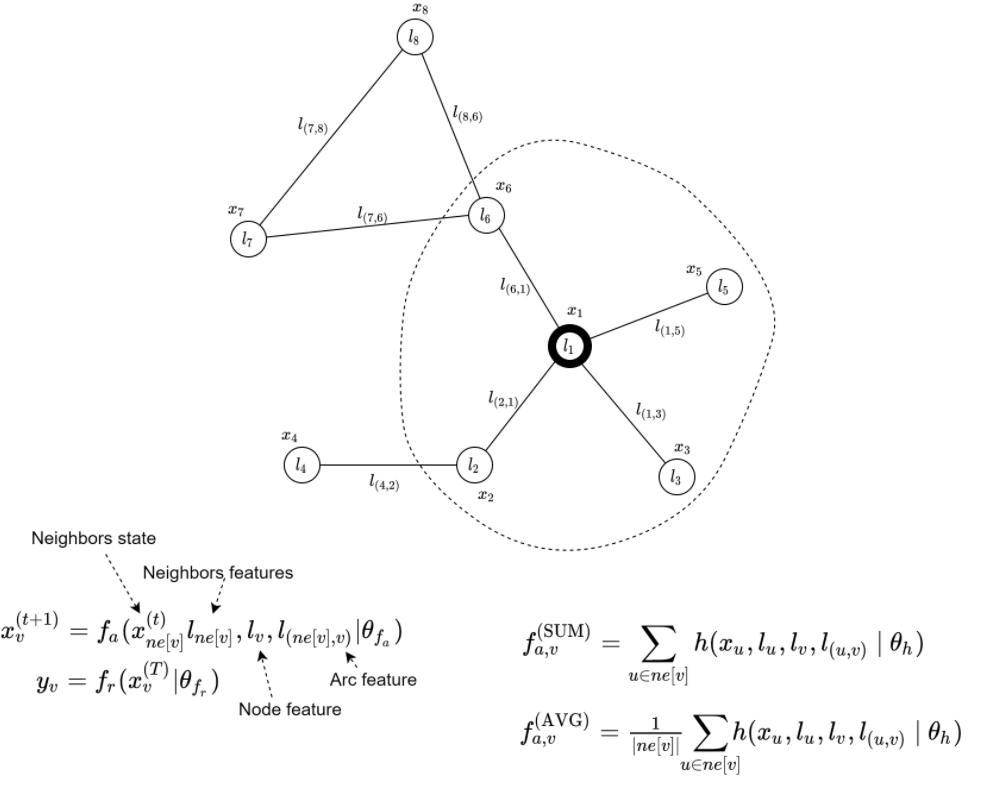

The state transition function must be capable to act on differently sized neighborhoods (the number of $ne[v]$  size of $|x_{ne[v]}|$ could vary for different nodes) - an MLP could not be used (without resorting to padding etc.)

Think at $f_{a,v}   = \sum_{u \in ne[v]} h(x_u,l_u,l_v,l_{(u,v)}\ |\ \theta_h)$ as the **aggregation of messages exchanged by couples of neighboring nodes**, in order to obtain the $v$ node state.

In this case, $h()$ can be implemented by an MLP (fix-sized input). 


*   The same function $h()$ (e.g., an MLP) is used for every node in the graph, in order to gain generalization
* Moreover, the same $h()$ is shared among the iterations.




## A convergence procedure up to the fixed point 

- The recursive application of the state transition function $f_a()$ on the graph nodes ***yields a diffusion mechanism***, whose range depends on $T$

- In the original GNN model  the convergence procedure is executed **until convergence of the state representation**, i.e. until $x_n^{(t)} \simeq x_n^{(t-1)}, v \in V$. 

  - When $x_n^{(t)} - x_n^{(t-1)}  \simeq \text{convergence threshold}, v \in V$
  - ... or when reaching a **maximum number of iterations $T$**
-  Corresponds to the computation of the **fixed point** of $f_a()$ on the input graph. 
-  To guarantee the convergence of this phase, the transition function is required to be a  contraction map  -  **Banach Fixed Point Theorem**



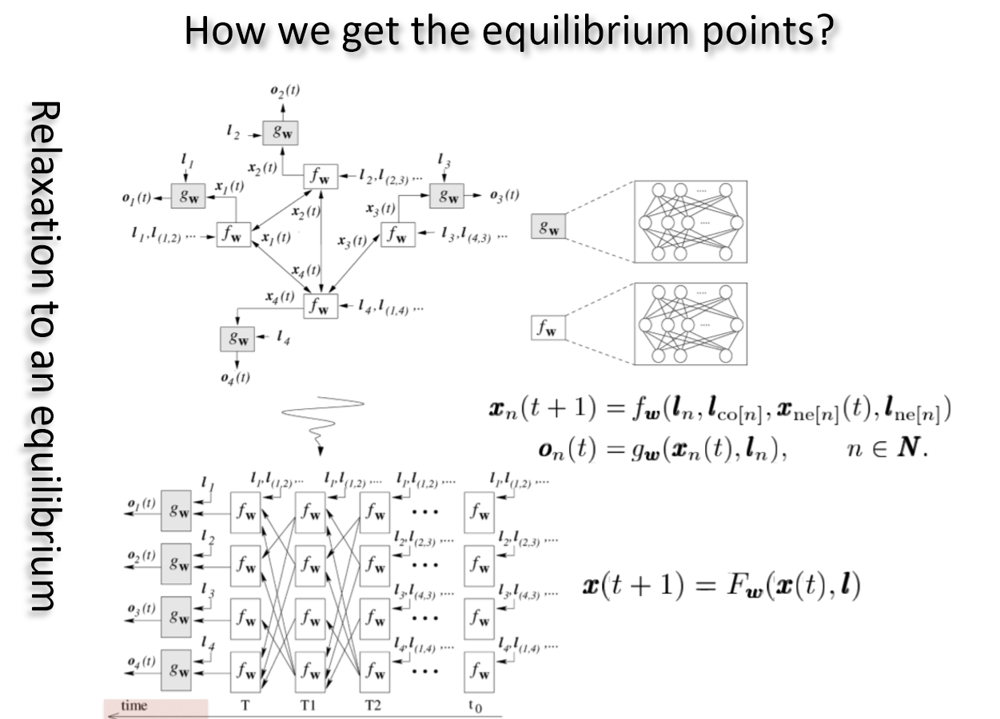

## PyTorch Implementation - State Convergence









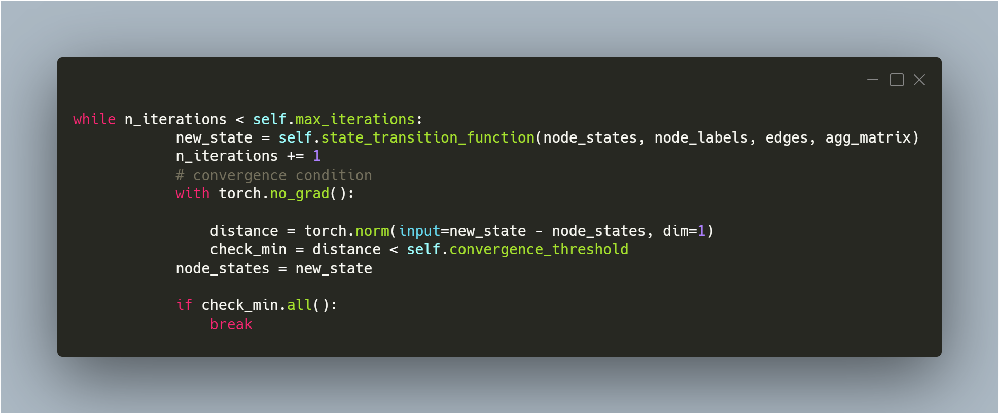

## State Transition Function 

$f_{a,v}   = \sum_{u \in ne[v]} h(x_u,l_u,l_v,l_{(u,v)}\ |\ \theta_h)$

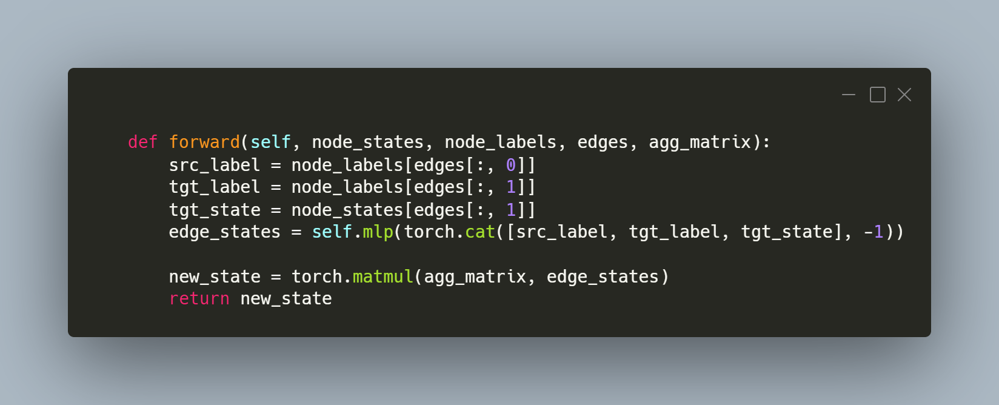

## The GNN framework
We provide a novel implementation which exploits the PyTorch framework (available also on TensorFlow). We simplified the GNN creation, and provide several tools for input creation (including some utilities and examples on using Deep Graph Library (DGL) input data).

[https://sailab.diism.unisi.it/gnn/](https://sailab.diism.unisi.it/gnn/)


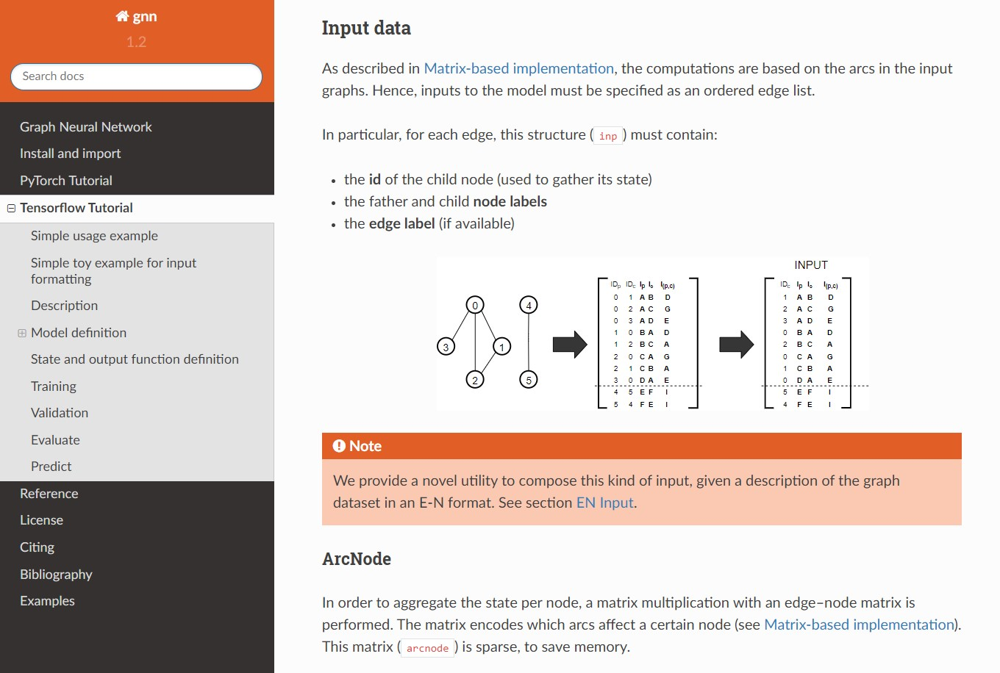

###  Part II.a - First Example: The Zachary’s karate club (node focused-task)
The karate club is a social network that includes 34 members and documents pairwise links between members who interact outside the club. The club later divides into two communities led by the instructor (node 0) and the club president (node 33). The network is visualized as follows with the color indicating the community:


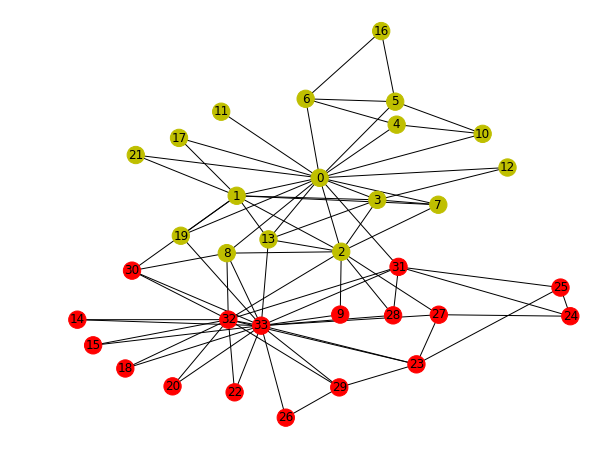

### Goal
The task is to predict which side (0 or 33) each member tends to join given the social network itself. The example is a revisited version of a [DGL tutorial.](https://docs.dgl.ai/en/0.4.x/tutorials/basics/1_first.html)

Download the GNN repo

In [9]:
!git clone https://github.com/mtiezzi/torch_gnn.git

Cloning into 'torch_gnn'...
remote: Enumerating objects: 167, done.
remote: Counting objects: 100% (167/167), done.
remote: Compressing objects: 100% (114/114), done.
remote: Total 167 (delta 86), reused 121 (delta 49), pack-reused 0
Receiving objects: 100% (167/167), 5.96 MiB | 27.48 MiB/s, done.
Resolving deltas: 100% (86/86), done.


Enter in the repo folder

In [10]:
cd torch_gnn

/content/torch_gnn


Some utilities and libraries

In [11]:


import torch
import torch.nn as nn
import numpy as np
import argparse
import utils
import dataloader
from gnn_wrapper import GNNWrapper, SemiSupGNNWrapper
import matplotlib.pyplot as plt
import networkx as nx

Defining the Karate Graph as edge-list

In [12]:
import numpy as np
import torch

def build_karate_club_graph():
    # All 78 edges are stored in two numpy arrays. One for source endpoints
    # while the other for destination endpoints.
    src = np.array([1, 2, 2, 3, 3, 3, 4, 5, 6, 6, 6, 7, 7, 7, 7, 8, 8, 9, 10, 10,
        10, 11, 12, 12, 13, 13, 13, 13, 16, 16, 17, 17, 19, 19, 21, 21,
        25, 25, 27, 27, 27, 28, 29, 29, 30, 30, 31, 31, 31, 31, 32, 32,
        32, 32, 32, 32, 32, 32, 32, 32, 32, 33, 33, 33, 33, 33, 33, 33,
        33, 33, 33, 33, 33, 33, 33, 33, 33, 33])
    dst = np.array([0, 0, 1, 0, 1, 2, 0, 0, 0, 4, 5, 0, 1, 2, 3, 0, 2, 2, 0, 4,
        5, 0, 0, 3, 0, 1, 2, 3, 5, 6, 0, 1, 0, 1, 0, 1, 23, 24, 2, 23,
        24, 2, 23, 26, 1, 8, 0, 24, 25, 28, 2, 8, 14, 15, 18, 20, 22, 23,
        29, 30, 31, 8, 9, 13, 14, 15, 18, 19, 20, 22, 23, 26, 27, 28, 29, 30,
        31, 32])
    # Make the edges bi-directional.
    u = np.concatenate([src, dst])
    v = np.concatenate([dst, src])
    # Construct a DGLGraph
    return np.column_stack((u, v))



In [13]:
E = build_karate_club_graph()

Here we use the[ EN input format](http://sailab.diism.unisi.it/gnn/PyTorch.html#enmatrices-pytorch) :

* **E**  numpy array of edges : `[[id_p, id_c, graph_id],…]`. One row for each arc in the dataset. First column must contain the ids of father nodes, the second column ids of child nodes. The third column contains an id that identifies the graph (to which the node belongs) in the dataset.

* **N**  numpy array of nodes features - `[[node_features, graph_id],… ]`. One row for each and every node. A set of columns containing the nodes features. The last column is an id that identifies the graph (to which the node belongs) in the dataset.

 The `graph_id` component is used for inductive tasks, in order to be able to represent with a single **E** (and **N**) matrix more graphs represented as disconnected components. 





In [14]:
# Add a further column to identify the graph - here we have only one graph
E = np.asarray(np.column_stack((E, np.zeros(len(E)))), dtype=np.int)

In [15]:
E

array([[ 1,  0,  0],
       [ 2,  0,  0],
       [ 2,  1,  0],
       [ 3,  0,  0],
       [ 3,  1,  0],
       [ 3,  2,  0],
       [ 4,  0,  0],
       [ 5,  0,  0],
       [ 6,  0,  0],
       [ 6,  4,  0],
       [ 6,  5,  0],
       [ 7,  0,  0],
       [ 7,  1,  0],
       [ 7,  2,  0],
       [ 7,  3,  0],
       [ 8,  0,  0],
       [ 8,  2,  0],
       [ 9,  2,  0],
       [10,  0,  0],
       [10,  4,  0],
       [10,  5,  0],
       [11,  0,  0],
       [12,  0,  0],
       [12,  3,  0],
       [13,  0,  0],
       [13,  1,  0],
       [13,  2,  0],
       [13,  3,  0],
       [16,  5,  0],
       [16,  6,  0],
       [17,  0,  0],
       [17,  1,  0],
       [19,  0,  0],
       [19,  1,  0],
       [21,  0,  0],
       [21,  1,  0],
       [25, 23,  0],
       [25, 24,  0],
       [27,  2,  0],
       [27, 23,  0],
       [27, 24,  0],
       [28,  2,  0],
       [29, 23,  0],
       [29, 26,  0],
       [30,  1,  0],
       [30,  8,  0],
       [31,  0,  0],
       [31, 2

In [16]:
# feature matrix 
N =  np.eye(34)
N = np.column_stack((N, np.zeros(len(N))))

# targets and mask
targets = np.zeros(34)
targets[-1] = 1


In [17]:
def plot_graph(E, N):
    g = nx.Graph()
    g.add_nodes_from(range(N.shape[0]))
    g.add_edges_from(E[:, :2])
    nx.draw_spring(g, cmap=plt.get_cmap('Set1'), with_labels=True)
    plt.show()
    return g

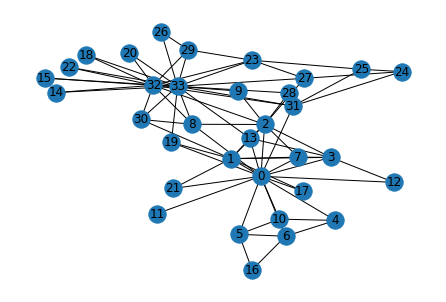

In [18]:
nx_G = plot_graph(E,N)


The following snippet defines the GNN model specifying some hyperparameters. 

Note that only two nodes (president and instructor nodes) belong to the training set - this is a semisupervised task.

Remember the state transition function for node state computation: $x_v^{(t)} = f_{a,v}   = \sum_{u \in ne[v]} h(x_u^{(t-1)},l_u,l_v,l_{(u,v)}\ |\ \theta_h)$

In [19]:
cfg = GNNWrapper.Config()
cfg.use_cuda = False
cfg.device = utils.prepare_device(n_gpu_use=1, gpu_id=0)
cfg.tensorboard = False
cfg.epochs = 500

cfg.activation = nn.Tanh()
cfg.state_transition_hidden_dims = [5,]
cfg.output_function_hidden_dims = [5]
cfg.state_dim = 5
cfg.max_iterations = 50
cfg.convergence_threshold = 0.01
cfg.graph_based = False
cfg.log_interval = 10
cfg.task_type = "semisupervised"
cfg.lrw = 0.001

Executing on device:  cpu


Specify training masks (***the node index to be considered***) to denote the instructor and president nodes `(0, 33)` and the other nodes (from node 1 to 32).

Usage of the `from_EN_to_GNN()` dataloder in order to ease the production of the dataset in the GNN format

In [20]:
model = SemiSupGNNWrapper(cfg)
dset = dataloader.from_EN_to_GNN(E, N, targets, aggregation_type="sum", sparse_matrix=True)  # generate the dataset

mask_train = np.asarray([0, 33])
mask_test = np.arange(1, 32, dtype=int)
dset.idx_train = mask_train
dset.idx_test = mask_test

/content/torch_gnn/dataloader.py:603: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
  agg_matrix_i = torch.LongTensor([g_ids, list(range(len(g_ids)))])


Initialize the dataset into the model, and create  list to hold the output for each node during training.  Notice: it is a two class problem - **hence, we can plot in a bidimensional space the model outputs!**

In [21]:
model(dset)  # dataset initalization into the GNN
list_out = []
list_out_test = []

In [22]:
for epoch in range(1, 1000):
        out = model.train_step(epoch)      
        
        if epoch % 10 ==0:
          out_test = model.test_step(epoch)

          list_out.append(out.detach())
          list_out_test.append(out_test.detach())


Train Epoch: 10 	 Mean Loss: 0.651242	Accuracy Full Batch: 0.500000 	  Best Accuracy : 0.500000  	 Iterations: 17
Test set: Average loss: 0.5549, Accuracy:  (1.0000%) , Best Accuracy:  (1.0000%)
Train Epoch: 20 	 Mean Loss: 0.619593	Accuracy Full Batch: 1.000000 	  Best Accuracy : 1.000000  	 Iterations: 50
Test set: Average loss: 0.5509, Accuracy:  (1.0000%) , Best Accuracy:  (1.0000%)
Train Epoch: 30 	 Mean Loss: 0.583172	Accuracy Full Batch: 1.000000 	  Best Accuracy : 1.000000  	 Iterations: 50
Test set: Average loss: 0.5282, Accuracy:  (1.0000%) , Best Accuracy:  (1.0000%)
Train Epoch: 40 	 Mean Loss: 0.553893	Accuracy Full Batch: 1.000000 	  Best Accuracy : 1.000000  	 Iterations: 50
Test set: Average loss: 0.5068, Accuracy:  (1.0000%) , Best Accuracy:  (1.0000%)
Train Epoch: 50 	 Mean Loss: 0.519703	Accuracy Full Batch: 1.000000 	  Best Accuracy : 1.000000  	 Iterations: 50
Test set: Average loss: 0.4874, Accuracy:  (1.0000%) , Best Accuracy:  (1.0000%)
Train Epoch: 60 	 Mean Lo

In [23]:
all_logits = list_out

In [24]:
import matplotlib.animation as animation
import matplotlib.pyplot as plt

def draw(i):
    cls1color = '#00FFFF'
    cls2color = '#FF00FF'
    pos = {}
    colors = []
    for v in range(34):
        pos[v] = all_logits[i][v].detach().numpy()
        cls = pos[v].argmax()
        colors.append(cls1color if cls else cls2color)
    ax.cla()
    ax.axis('off')
    ax.set_title('Epoch: %d' % i)
    nx.draw_networkx(nx_G.to_undirected(), pos, node_color=colors,
            with_labels=True, node_size=300, ax=ax)

fig = plt.figure(dpi=150)
fig.clf()
ax = fig.subplots()
draw(0)  # draw the prediction of the first epoch
plt.close()

In [25]:
from matplotlib import rc
rc('animation', html='jshtml')

In [26]:
ani = animation.FuncAnimation(fig, draw, frames=len(all_logits), interval=200)

In [27]:
ani

Task: predict which side (instructor: `0` or president: `33`) each other member tends to join given the social network itself.

**Conclusions:** given solely the graph topology and two supervised nodes (instructor node `0` and president node `33`), the model learned to divide the space of nodes into the two groups!

### Part II.b - Node classification: The  Subgraph Matching problem

 Related to the graph isomorphism problem:
 - Two graph are isomorphic if **topologically equivalent**
  -  There exist a node index permutation preserving adjacencies 


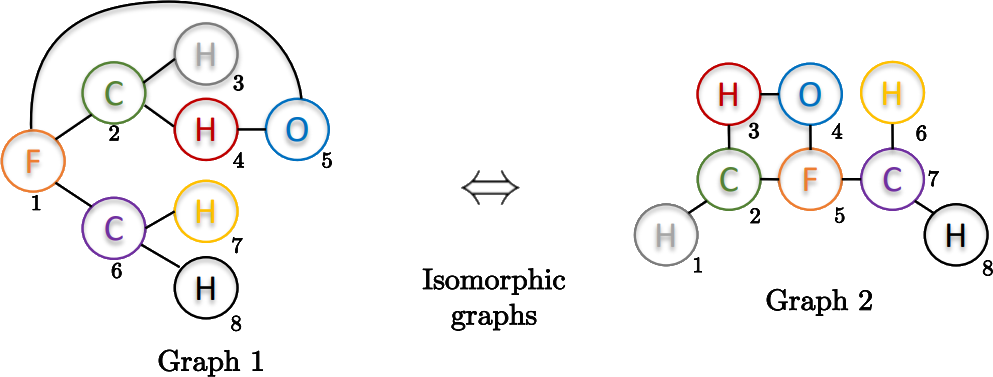

Side note: a very hot topic  -  **Weisfeler-Lehman GNNs**

The [Weisfeler-Lehman test ](https://www.iti.zcu.cz/wl2018/pdf/wl_paper_translation.pdf) guarantee that two graphs are **not isomorphic**
- **Not sufficient** to guarantee isomorphism
- [Graph Isomorphism Network (GIN) ](https://arxiv.org/pdf/1810.00826.pdf): a GNN able to distinguish non-isomorphic graphs
- [Have a look at these slides for further details ](https://mtiezzi.github.io/files/maasai_presentation_lpgnn.pdf)





It is a very difficult task , for which it is not clearly defined the class of complexity - maybe an NP problem.

#### Subgraph matching

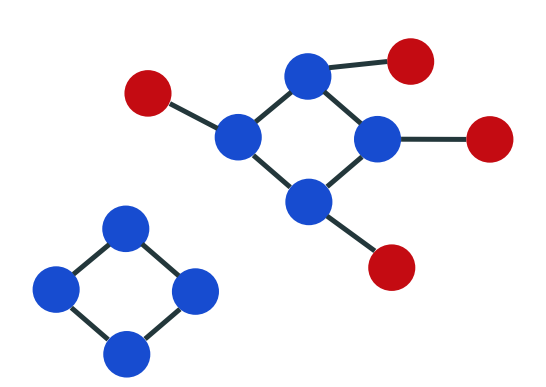

**BLUE Nodes** : target subgraph to be located inside the various graphs of the dataset.

**IDEA:** Approximate the Subgraph matching problem casting it to a node-focus classification task.




- **Example** Find a particular small molecule inside a greater compound.
- **Subgraph Matching** Given a graph $G$ and a graph $S$ such that $|S| \le |G|$, find the nodes of a subgraph $\hat S \subset G$ which is isomorphic to $S$.  
-  **Task** learn a function $\tau_S$, such that 
  - $\tau_S(G,n)=1, n \in V$, when the node $n$ belongs to the given subgraph $S$ (**BLUE** in the figure)
  - otherwise $\tau_S(G,n)=0$  (**RED** in the figure).

The target subgraph $S$ is predefined in the learning phase by providing examples of graphs $G$ that contain $S$ (the nodes of $G$ that define the subgraph $S$ have a supervision equal to 1).



#### Other details
- The nodes have integer nodal
features in the range $[0,10$], with the addition of a small normal noise, with zero mean and a standard deviation of 0.25. 

-  The GNN model must be capable to exploit both the topological connectivity and the relative distribution of the labels in S w.r.t the labels in the graphs.

- **Inductive Setting** Train the GNN on a training set composed by certain graphs, validate and test on unseen inputs having different graphs with the same distribution. 

  - Training set, validation and test set composed by 200 graphs each


In [28]:
!git clone https://github.com/mtiezzi/torch_gnn.git

Cloning into 'torch_gnn'...
remote: Enumerating objects: 167, done.
remote: Counting objects: 100% (167/167), done.
remote: Compressing objects: 100% (114/114), done.
remote: Total 167 (delta 86), reused 121 (delta 49), pack-reused 0
Receiving objects: 100% (167/167), 5.96 MiB | 22.27 MiB/s, done.
Resolving deltas: 100% (86/86), done.


In [29]:
cd torch_gnn

/content/torch_gnn/torch_gnn


In [30]:
import torch
import torchvision
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import argparse
import utils
import dataloader

from gnn_wrapper import GNNWrapper

n_gpu_use = 1
use_cuda =  torch.cuda.is_available()
if not use_cuda:
    n_gpu_use = 0

device = utils.prepare_device(n_gpu_use=n_gpu_use, gpu_id=0)

cfg = GNNWrapper.Config()
cfg.use_cuda = use_cuda
cfg.device = device

cfg.log_interval = 100

cfg.dataset_path = './data'
cfg.epochs = 10000
cfg.lrw = 0.001
cfg.activation = nn.Sigmoid()
cfg.state_transition_hidden_dims = [10, ]
cfg.output_function_hidden_dims = [ 5]
cfg.state_dim = 10
cfg.max_iterations = 50
cfg.convergence_threshold = 0.01
cfg.graph_based = False
cfg.log_interval = 100
cfg.lrw = 0.01
cfg.task_type = "multiclass"

model_tr = GNNWrapper(cfg)
model_val = GNNWrapper(cfg)
model_tst = GNNWrapper(cfg)
# dataset creation
dset = dataloader.get_subgraph(set="sub_10_5_200", aggregation_type="sum", sparse_matrix=True)  # generate the dataset
model_tr(dset["train"])  # dataset initalization into the GNN
model_val(dset["validation"], state_net=model_tr.gnn.state_transition_function, out_net=model_tr.gnn.output_function)  # dataset initalization into the GNN
model_tst(dset["test"], state_net=model_tr.gnn.state_transition_function, out_net=model_tr.gnn.output_function)  # dataset initalization into the GNN


Executing on device:  cpu


Have a look at the data/subcli folder for the available dataset!  {sub, cli}\_{10, 15}_{5,7}_200.mat

In [31]:
dset["train"].node_labels

tensor([[ 7.7254,  5.7501],
        [-0.0087,  5.7547],
        [ 3.0714,  1.6394],
        ...,
        [ 8.2764,  1.1215],
        [ 6.7465,  8.3302],
        [ 7.5714,  3.0121]])

In [32]:
dset["train"].edges

tensor([[   0,    7],
        [   0,    8],
        [   1,    4],
        ...,
        [1999, 1994],
        [1999, 1995],
        [1999, 1997]])

In [33]:
dset["train"].edges[:66]

tensor([[ 0,  7],
        [ 0,  8],
        [ 1,  4],
        [ 1,  6],
        [ 1,  8],
        [ 1,  9],
        [ 2,  3],
        [ 2,  4],
        [ 3,  2],
        [ 3,  4],
        [ 4,  1],
        [ 4,  2],
        [ 4,  3],
        [ 4,  7],
        [ 5,  9],
        [ 6,  1],
        [ 7,  0],
        [ 7,  4],
        [ 7,  9],
        [ 8,  0],
        [ 8,  1],
        [ 9,  1],
        [ 9,  5],
        [ 9,  7],
        [10, 14],
        [10, 18],
        [11, 14],
        [12, 13],
        [12, 15],
        [12, 18],
        [13, 12],
        [13, 17],
        [13, 18],
        [14, 10],
        [14, 11],
        [15, 12],
        [15, 16],
        [15, 19],
        [16, 15],
        [17, 13],
        [18, 10],
        [18, 12],
        [18, 13],
        [18, 19],
        [19, 15],
        [19, 18],
        [20, 21],
        [20, 22],
        [20, 27],
        [21, 20],
        [22, 20],
        [23, 29],
        [24, 25],
        [24, 26],
        [25, 24],
        [2

In [34]:
targets_first_three = dset["train"].targets[:30]

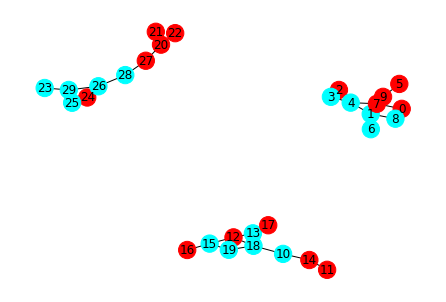

In [35]:
import networkx as nx
G = nx.Graph()
G.add_nodes_from(range(30)) # node indices
color_map = []
for i, node in enumerate(G):
    if targets_first_three[i] == 0:
        color_map.append('red')
    else: 
        color_map.append('cyan') 
G.add_edges_from(dset["train"].edges[:66].numpy()) # edge list given as input to the graph G
nx.draw_spring(G, cmap=plt.get_cmap('Set1'), with_labels=True, node_color=color_map,)
plt.show()


In [36]:
for epoch in range(cfg.epochs):
    model_tr.train_step(epoch)
    if epoch % 500 == 0:
        model_tst.test_step(epoch)
        model_val.valid_step(epoch)

Train Epoch: 0 	 Mean Loss: 0.845134	Accuracy Full Batch: 0.506000 	  Best Accuracy : 0.506000  	 Iterations: 4
Test set: Average loss: 0.8169, Accuracy:  (0.5055%) , Best Accuracy:  (0.5055%)
Valid set: Average loss: 0.8187, Accuracy:  (0.5035%) , Best Accuracy:  (0.5035%)
Train Epoch: 100 	 Mean Loss: 0.514147	Accuracy Full Batch: 0.783000 	  Best Accuracy : 0.783000  	 Iterations: 7
Train Epoch: 200 	 Mean Loss: 0.221748	Accuracy Full Batch: 0.925000 	  Best Accuracy : 0.925500  	 Iterations: 50
Train Epoch: 300 	 Mean Loss: 0.154230	Accuracy Full Batch: 0.950500 	  Best Accuracy : 0.950500  	 Iterations: 50
Train Epoch: 400 	 Mean Loss: 0.116387	Accuracy Full Batch: 0.967000 	  Best Accuracy : 0.967500  	 Iterations: 50
Train Epoch: 500 	 Mean Loss: 0.092523	Accuracy Full Batch: 0.976000 	  Best Accuracy : 0.976000  	 Iterations: 50
Test set: Average loss: 0.1727, Accuracy:  (0.9430%) , Best Accuracy:  (0.9430%)
Valid set: Average loss: 0.1596, Accuracy:  (0.9480%) , Best Accuracy:

### Part II.c - Another exercise - Clique Detection

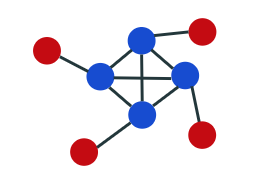


- **Example** Group of mutually connected friends in a social network.
- **Clique Localization** A clique is a complete graph, i.e. a graph in which each node is connected with all the others.
- Instance of the subgraph matching problem, with $S$ being complete. However, the several symmetries contained in a clique makes the graph isomorphism test more difficult. Indeed, it is known that the graph isomorphism has polynomial time solutions only in absence of symmetries. 
- **Task** learn a function $\tau_S$, such that 
  - $\tau_S(G,n)=1, n \in V$, when the node $n$ belongs to the given clique $S$
  - otherwise $\tau_S(G,n)=0$.

- The target clique $S$ is predefined in the learning phase by providing examples of graphs $G$ that contain $S$ (the nodes of $G$ that define the clique $S$ have a supervision equal to 1).



#### Other details

- The nodes have integer nodal features in the range $[0,8$].
- The GNN model must be capable to exploit both the topological connectivity and the relative distribution of the labels in S w.r.t the labels in the graphs.
- **Inductive Setting** Train the GNN on a training set composed by certain graphs, validate and test on unseen inputs having different graphs with the same distribution. 
- Training set, validation and test set composed by 200 graphs each






In [37]:
!git clone https://github.com/mtiezzi/torch_gnn.git

Cloning into 'torch_gnn'...
remote: Enumerating objects: 167, done.
remote: Counting objects: 100% (167/167), done.
remote: Compressing objects: 100% (114/114), done.
remote: Total 167 (delta 86), reused 121 (delta 49), pack-reused 0
Receiving objects: 100% (167/167), 5.96 MiB | 25.96 MiB/s, done.
Resolving deltas: 100% (86/86), done.


In [38]:
cd torch_gnn

/content/torch_gnn/torch_gnn/torch_gnn


In [39]:
import torch
import torchvision
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import argparse
import utils
import dataloader

from gnn_wrapper import GNNWrapper

n_gpu_use = 1
use_cuda =  torch.cuda.is_available()
if not use_cuda:
    n_gpu_use = 0

device = utils.prepare_device(n_gpu_use=n_gpu_use, gpu_id=0)

cfg = GNNWrapper.Config()
cfg.use_cuda = use_cuda
cfg.device = device

cfg.log_interval = 100

Executing on device:  cpu


In [42]:
"put your code here!"
"use the following command to load the clique dataset: "
dset = dataloader.get_subgraph(set="cli_15_7_200", aggregation_type="sum", sparse_matrix=True)  # generate the dataset


Have a look at the data/subcli folder for the available dataset!  {sub, cli}\_{10, 15}_{5,7}_200.mat

## LP-GNNs : Avoid the explicit iterative computation of the fixed point

Weak points of the original model: 

*   Epoch wise ad-hoc iterative convergence and BackProp

Solution: Cast the learning problem as constrained optimization

*   LAGRANGIAN PROPAGATION GRAPH NEURAL NETWORKS – **LP-GNNS**
*   Jointly optimize the model weights and the state representations without the need of separate ad-hoc optimization stages.
*   **LP-GNNs** strictly split deep feature extraction from the diffusion mechanism.
*   Pluggable into all SOTA models, leveraging powerfull aggregation functions
empowered by diffusion over the graph.


[Slides](https://mtiezzi.github.io/files/maasai_presentation_lpgnn.pdf)

[Paper](https://ieeexplore.ieee.org/abstract/document/9405452)

[Arxiv](https://arxiv.org/abs/2005.02392) 

[Repository](https://github.com/mtiezzi/lpgnn)

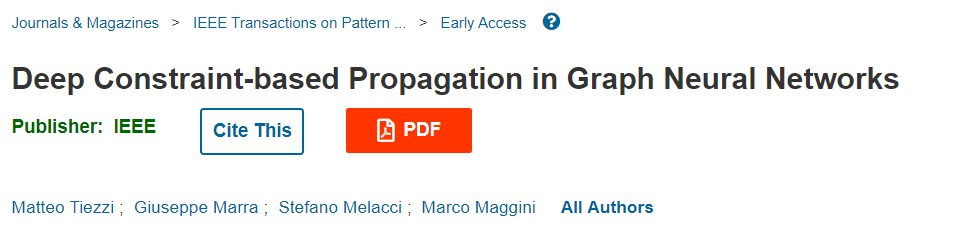

# Part III:  Other GNN models - Graph Convolutional Nets and more

## Graph Neural Networks Timeline

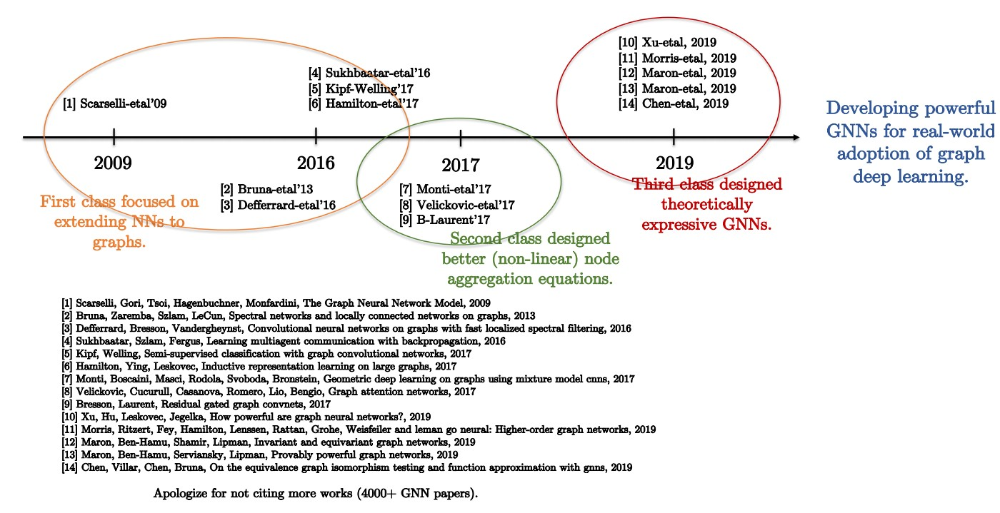

## Message Passing Neural Network 
Describe the models under a common framework ( [by Gilmer et al. 2017](https://arxiv.org/abs/1704.01212))

- Minimal requirements to design  a message passing node aggregation function
  - Permutation invariance
  - Independent on neighborhood size (**1-hop**)
  - Exploit same aggregation function  among the nodes (gain generalization)
  - Linear complexity on the Edges

- MPNN are the most powerfull GNNs model - maximum expressivity, possible to describe all the models under this framework!






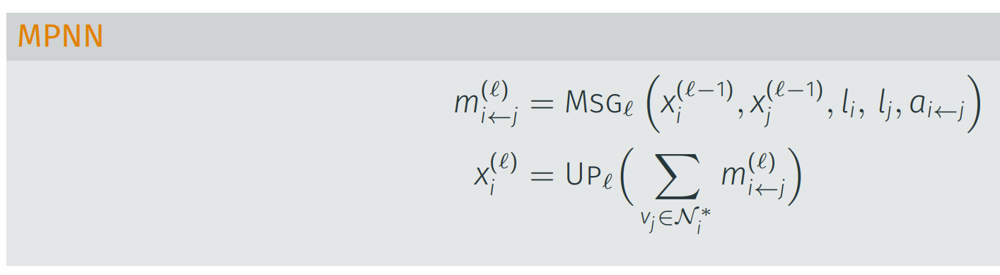

## PART III.a - Graph Convolutional Networks




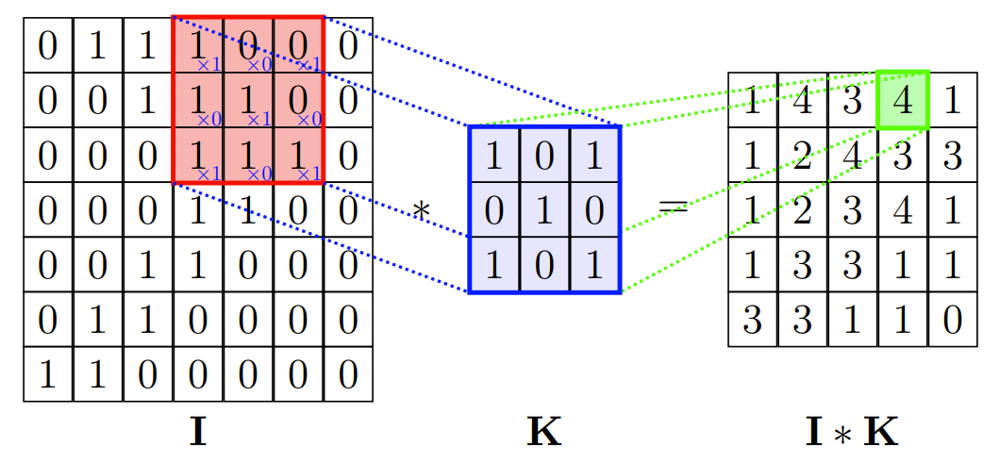

Inspired by the operation of *convolutions* on images (CNNs).

A simpler node feature update rule than general message passing 
- Aggregate neighbourhoods using the adjancency matrix  $A$

$a_{i,j} = \begin{cases} 1 & (i, j) \in E \\
0  & \text{else}
\end{cases}
$
 


#### GCN update rule

$ H^{\ell +1} = \sigma (AH^{\ell}W^{\ell})$, with $\ell \in \{0,1,..., n\}$

where $H^0$ are the node initial features that are updated by stacking many aggregaton layers, and $W^{\ell}$ is a learnable node-wise shared linear transformation, $\sigma$ is a non-linearity. 


Node-wise update: 
$h_i' = \sigma(\sum_{j \in N_i} Wh_j)$ 

- Better consider also the node itself in the update rule:
$\hat{A}= A + I $

- Normalize with the size of the neighboorhood :
  - Degree Matrix $\hat{D}_{ii} = \sum_j \hat{A}_{ij}$



- $ H^{\ell +1} = \sigma (\hat{D}^{-1}AH^{\ell}W)$,


- Node-wise update:

 - $h_i' = \sigma(\sum_{j \in N_i} \frac{1}{|N_i|} Wh_j)$   

#### GCN update rule
Simmetric normalization 
 - $ H^{\ell +1} = \sigma (\hat{D}^{-1/2}\hat{A}\hat{D}^{-1/2}H^{\ell}W^{\ell})$,

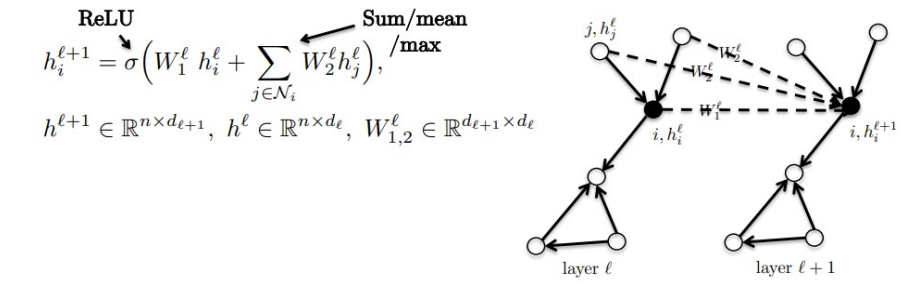

Layered structure $\rightarrow$ depth foster aggregation

####  Isotropic GCN
- In the aggregation phase, every neighbor contributes equally aggregation
  -  [ GCN](https://arxiv.org/abs/1609.02907)
  -  [GraphSAGE](https://papers.nips.cc/paper/2017/file/5dd9db5e033da9c6fb5ba83c7a7ebea9-Paper.pdf) 
  - Every direction is **treated in the same way**

### Anisotropic GCN  (attentional models)
-  Gaining a **directional structure**
-  How:
  - Adding **Edge Features if available**
  - **Learn anisotropy** to treat neighbors differently 
    - [Graph Attention Networks](https://arxiv.org/abs/1710.10903)
    - [MoNet](https://arxiv.org/abs/1611.08402)

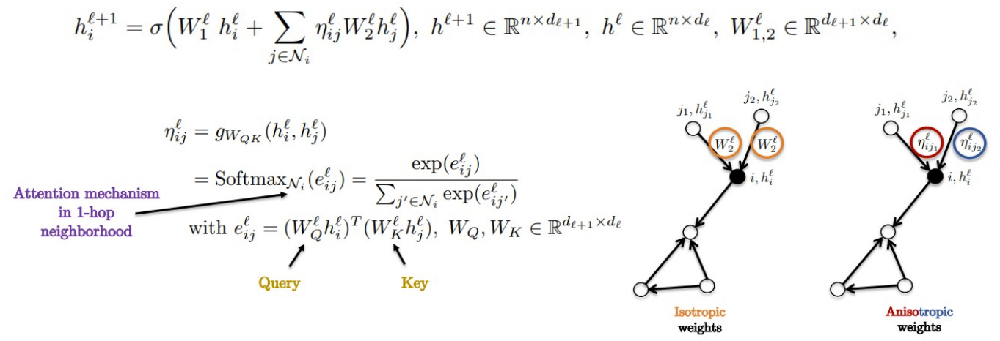

## Part III.b - GNN frameworks



### Available Frameworks 
Avoid the boiler plate of model implementation, they provide many ready to use  GNN models (in Tensorflow, PyTorch, etc.)

- [GNN Framework ](http://sailab.diism.unisi.it/gnn/)
- [Deep Graph Library ](https://www.dgl.ai/)
- [PyTorch Geometric ](https://pytorch-geometric.readthedocs.io/en/latest/)


And many others!

### Available Datasets


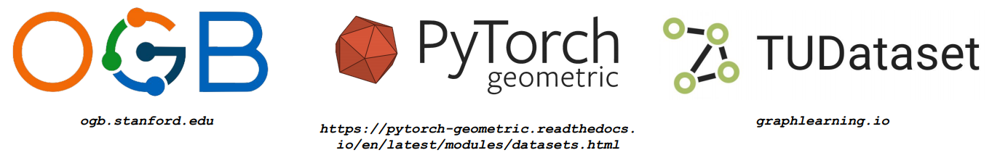

## Part III.c - Deep Graph Library (DGL)
- Handles large scale/real world graphs - **batching, multiprocess, distributed**
- Framework agnostic (PyTorch, TF, MXNet)
- Many GNNs models ready-to-go **ConvGNNs** - GCN, GAT, GIN, GraphSAGE, etc. )
- **Dataloaders** for Open Graph Benchmark (OGB) and many other classic graph benchmarks


### DGL usage example: The Zachary’s karate club (node focused-task)

In [43]:
!pip install dgl

     |████████████████████████████████| 4.4 MB 18.6 MB/s 


In [44]:
import dgl
import numpy as np
import networkx as nx
from dgl.data import KarateClubDataset


import torch
import torch.nn as nn
import torch.nn.functional as F

kc = KarateClubDataset()

DGL backend not selected or invalid.  Assuming PyTorch for now.
Using backend: pytorch


Setting the default backend to "pytorch". You can change it in the ~/.dgl/config.json file or export the DGLBACKEND environment variable.  Valid options are: pytorch, mxnet, tensorflow (all lowercase)


/usr/local/lib/python3.7/dist-packages/dgl/data/utils.py:285: UserWarning: Property dataset.data will be deprecated, please use dataset[0] instead.
  warnings.warn('Property {} will be deprecated, please use {} instead.'.format(old, new))


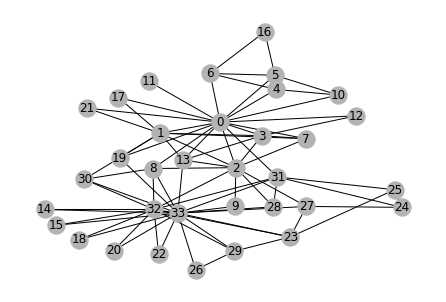

In [45]:
nx_G =kc.data[0].to_networkx().to_undirected()
# Kamada-Kawaii layout usually looks pretty for arbitrary graphs
pos = nx.kamada_kawai_layout(nx_G)
nx.draw(nx_G, pos, with_labels=True, node_color=[[.7, .7, .7]])

In [46]:
G = kc.data[0]
G.ndata['feat'] = torch.eye(34)

/usr/local/lib/python3.7/dist-packages/dgl/data/utils.py:285: UserWarning: Property dataset.data will be deprecated, please use dataset[0] instead.
  warnings.warn('Property {} will be deprecated, please use {} instead.'.format(old, new))


In [47]:
G.ndata['feat'].shape

torch.Size([34, 34])

Import the Graph Convolution operation implemented in  DGL

In [48]:
from dgl.nn.pytorch import GraphConv

In [49]:
class GCN(nn.Module):
    def __init__(self, in_feats, hidden_size, num_classes):
        super(GCN, self).__init__()
        self.conv1 = GraphConv(in_feats, hidden_size)
        self.conv2 = GraphConv(hidden_size, num_classes)

    def forward(self, g, inputs):
        h = self.conv1(g, inputs)
        h = torch.relu(h)
        h = self.conv2(g, h)
        return h

# The first layer transforms input features of size of 34 to a hidden size of 10.
# The second layer transforms the hidden layer and produces output features of
# size 2, corresponding to the two classes of the karate club.
net = GCN(34, 10, 2)

In [50]:
inputs = G.ndata['feat']
labeled_nodes = torch.tensor([0, 33])  # only the instructor and the president nodes are labeled
labels = G.ndata['label']
unlabeled_nodes = torch.tensor(range(1,33))

In [51]:
all_logits = []
optimizer = torch.optim.Adam(net.parameters(), lr=0.01)
for epoch in range(50):
    logits = net(G, inputs)
    # we save the logits for visualization later
    all_logits.append(logits.detach())
    logp = F.log_softmax(logits, 1)
    # we only compute loss for labeled nodes
    loss = F.nll_loss(logp[labeled_nodes], labels[labeled_nodes])
    loss_unlabeled = F.nll_loss(logp[unlabeled_nodes], labels[unlabeled_nodes])


    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    print('Epoch %d | Loss: %.4f  |  Loss Test: %.4f' % (epoch, loss.item(), loss_unlabeled.item()))

/usr/local/lib/python3.7/dist-packages/torch/autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


Epoch 0 | Loss: 0.6461  |  Loss Test: 0.6934
Epoch 1 | Loss: 0.6243  |  Loss Test: 0.6879
Epoch 2 | Loss: 0.6021  |  Loss Test: 0.6806
Epoch 3 | Loss: 0.5782  |  Loss Test: 0.6724
Epoch 4 | Loss: 0.5531  |  Loss Test: 0.6635
Epoch 5 | Loss: 0.5274  |  Loss Test: 0.6541
Epoch 6 | Loss: 0.5010  |  Loss Test: 0.6440
Epoch 7 | Loss: 0.4738  |  Loss Test: 0.6328
Epoch 8 | Loss: 0.4451  |  Loss Test: 0.6205
Epoch 9 | Loss: 0.4158  |  Loss Test: 0.6076
Epoch 10 | Loss: 0.3865  |  Loss Test: 0.5936
Epoch 11 | Loss: 0.3576  |  Loss Test: 0.5791
Epoch 12 | Loss: 0.3293  |  Loss Test: 0.5643
Epoch 13 | Loss: 0.3015  |  Loss Test: 0.5492
Epoch 14 | Loss: 0.2752  |  Loss Test: 0.5338
Epoch 15 | Loss: 0.2506  |  Loss Test: 0.5186
Epoch 16 | Loss: 0.2272  |  Loss Test: 0.5035
Epoch 17 | Loss: 0.2051  |  Loss Test: 0.4886
Epoch 18 | Loss: 0.1841  |  Loss Test: 0.4737
Epoch 19 | Loss: 0.1646  |  Loss Test: 0.4589
Epoch 20 | Loss: 0.1467  |  Loss Test: 0.4443
Epoch 21 | Loss: 0.1305  |  Loss Test: 0.429

In [52]:
import matplotlib.animation as animation
import matplotlib.pyplot as plt

def draw(i):
    cls1color = '#00FFFF'
    cls2color = '#FF00FF'
    pos = {}
    colors = []
    for v in range(34):
        pos[v] = all_logits[i][v].numpy()
        cls = pos[v].argmax()
        colors.append(cls1color if cls else cls2color)
    ax.cla()
    ax.axis('off')
    ax.set_title('Epoch: %d' % i)
    nx.draw_networkx(nx_G.to_undirected(), pos, node_color=colors,
            with_labels=True, node_size=300, ax=ax)

fig = plt.figure(dpi=150)
fig.clf()
ax = fig.subplots()
draw(0)  # draw the prediction of the first epoch
plt.close()

In [53]:
from matplotlib import rc
rc('animation', html='jshtml')
ani = animation.FuncAnimation(fig, draw, frames=len(all_logits), interval=200)

In [54]:
ani

### Graph Classification (graph-focused task) and batching usign DGL

[The example](https://docs.dgl.ai/en/0.6.x/tutorials/basics/4_batch.html) task objective is to classify eight types of topologies shown here.

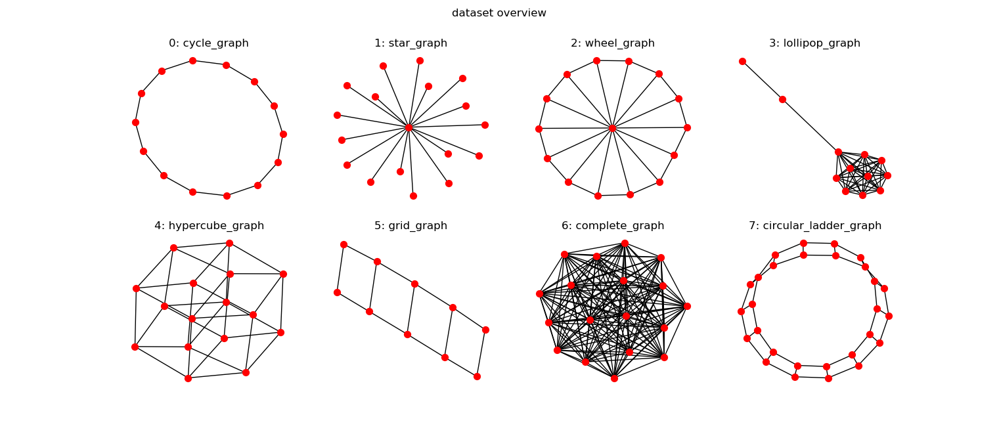

In [55]:
!pip install dgl

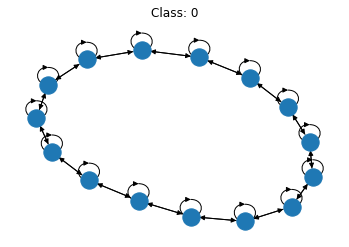

In [56]:
from dgl.data import MiniGCDataset
import matplotlib.pyplot as plt
import networkx as nx
# A dataset with 80 samples, each graph is
# of size [10, 20]
dataset = MiniGCDataset(80, 10, 20)
graph, label = dataset[0]
fig, ax = plt.subplots()
nx.draw(graph.to_networkx(), ax=ax)
ax.set_title('Class: {:d}'.format(label))
plt.show()

In [57]:
graph

Graph(num_nodes=15, num_edges=45,
      ndata_schemes={}
      edata_schemes={})

To train neural networks efficiently, a common practice is to batch multiple samples together to form a mini-batch.  To address this, DGL provides a dgl.batch() API. It leverages the idea that a batch of graphs can be viewed as a large graph that has many disjointed connected components.

In [58]:
import dgl
import torch

def collate(samples):
    # The input `samples` is a list of pairs
    #  (graph, label).
    graphs, labels = map(list, zip(*samples))
    batched_graph = dgl.batch(graphs)
    return batched_graph, torch.tensor(labels)

In [59]:
from dgl.nn.pytorch import GraphConv

#### Graph readout

In order to make a single prediction fot the whole graph, one usually aggregates and summarizes over the possibly abundant information. This type of operation is named **readout**. 
- Common readout operations include summation, average, maximum or minimum over all node or edge features.

- $h_g=\frac{1}{|\mathcal{V}|}\sum_{v\in\mathcal{V}}h_{v}$


In DGL,` dgl.mean_nodes() `handles this task for a batch of graphs with variable size. You then feed the graph representations into a classifier with one linear layer to obtain pre-softmax logits.



In [60]:
import torch.nn as nn
import torch.nn.functional as F

class Classifier(nn.Module):
    def __init__(self, in_dim, hidden_dim, n_classes):
        super(Classifier, self).__init__()
        self.conv1 = GraphConv(in_dim, hidden_dim)
        self.conv2 = GraphConv(hidden_dim, hidden_dim)
        self.classify = nn.Linear(hidden_dim, n_classes)

    def forward(self, g):
        # Use node degree as the initial node feature. For undirected graphs, the in-degree
        # is the same as the out_degree.
        h = g.in_degrees().view(-1, 1).float()
        # Perform graph convolution and activation function.
        h = F.relu(self.conv1(g, h))
        h = F.relu(self.conv2(g, h))
        g.ndata['h'] = h
        # Calculate graph representation by averaging all the node representations.
        hg = dgl.mean_nodes(g, 'h')
        return self.classify(hg)

Create a synthetic dataset of 400 graphs with 10 ~ 20 nodes. 320 graphs constitute a training set and 80 graphs constitute a test set.

In [61]:
import torch.optim as optim
from torch.utils.data import DataLoader

# Create training and test sets.
trainset = MiniGCDataset(320, 10, 20)
testset = MiniGCDataset(80, 10, 20)
# Use PyTorch's DataLoader and the collate function
# defined before.
data_loader = DataLoader(trainset, batch_size=32, shuffle=True,
                         collate_fn=collate)

# Create model
model = Classifier(1, 256, trainset.num_classes)
loss_func = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
model.train()

epoch_losses = []
for epoch in range(200):
    epoch_loss = 0
    for iter, (bg, label) in enumerate(data_loader):
        prediction = model(bg)
        loss = loss_func(prediction, label)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.detach().item()
    epoch_loss /= (iter + 1)
    print('Epoch {}, loss {:.4f}'.format(epoch, epoch_loss))
    epoch_losses.append(epoch_loss)

/usr/local/lib/python3.7/dist-packages/torch/autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


Epoch 0, loss 2.0069
Epoch 1, loss 1.9847
Epoch 2, loss 1.9674
Epoch 3, loss 1.9604
Epoch 4, loss 1.9451
Epoch 5, loss 1.9355
Epoch 6, loss 1.9160
Epoch 7, loss 1.8955
Epoch 8, loss 1.8659
Epoch 9, loss 1.8300
Epoch 10, loss 1.7896
Epoch 11, loss 1.7407
Epoch 12, loss 1.6918
Epoch 13, loss 1.6353
Epoch 14, loss 1.5695
Epoch 15, loss 1.5124
Epoch 16, loss 1.4551
Epoch 17, loss 1.3884
Epoch 18, loss 1.3371
Epoch 19, loss 1.2743
Epoch 20, loss 1.2295
Epoch 21, loss 1.1705
Epoch 22, loss 1.1415
Epoch 23, loss 1.1116
Epoch 24, loss 1.0648
Epoch 25, loss 1.0366
Epoch 26, loss 1.0094
Epoch 27, loss 0.9864
Epoch 28, loss 0.9678
Epoch 29, loss 0.9427
Epoch 30, loss 0.9298
Epoch 31, loss 0.9184
Epoch 32, loss 0.9148
Epoch 33, loss 0.9067
Epoch 34, loss 0.8842
Epoch 35, loss 0.8654
Epoch 36, loss 0.8465
Epoch 37, loss 0.8403
Epoch 38, loss 0.8479
Epoch 39, loss 0.8269
Epoch 40, loss 0.8205
Epoch 41, loss 0.8088
Epoch 42, loss 0.8285
Epoch 43, loss 0.7934
Epoch 44, loss 0.7914
Epoch 45, loss 0.792

Let's test the obtained model!

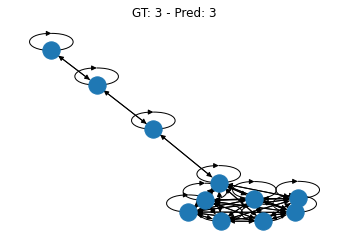

In [62]:
pick_a_graph, label_pick = testset[35]
prediction = model(pick_a_graph)

fig, ax = plt.subplots()
nx.draw(pick_a_graph.to_networkx(), ax=ax)
ax.set_title(f'GT: {label_pick} - Pred: {prediction.argmax().numpy()}')
plt.show()

In [63]:
prediction

tensor([[-113.6762,  -12.9960,    2.8527,    8.4223,   -5.8824,  -14.3620,
           -0.9103,  -46.4879]], grad_fn=<AddmmBackward0>)

**EXTRA**

### **Link prediction usign DGL**

#### Introduction

Another application that can be achieved using GNNs is the **link prediction problem**. This part is based on the [example](https://docs.dgl.ai/en/0.6.x/guide/training-link.html) and [SEAL](https://papers.nips.cc/paper/2018/file/53f0d7c537d99b3824f0f99d62ea2428-Paper.pdf). \\
Given a Graph, the task consists of predicting whether a link between two nodes **u** and **v** exists or not. This comes to calculate the likelihood of connectivity between these two nodes using the GNN node representation.

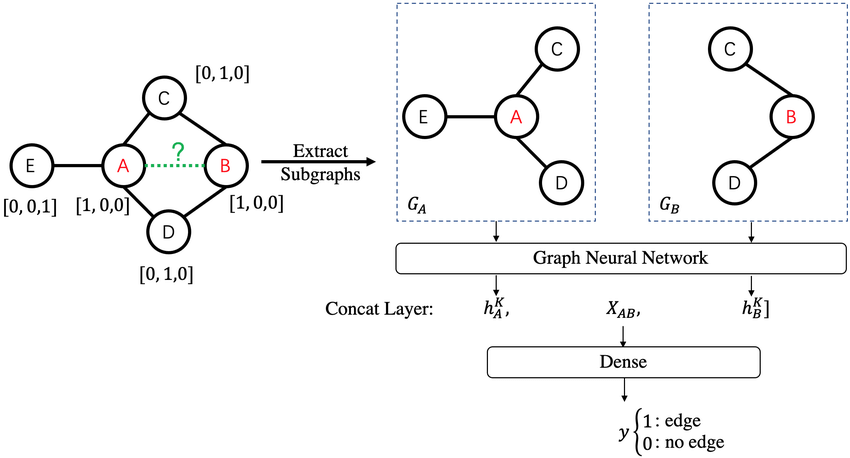

We define the score $y_{u,v}$ which is defined as : \\
$$y_{u,v} = \phi(h^{L}_{u}, h^{L}_{v})$$
Where : $h^{L}_{u}$ and $h^{L}_{v}$ are the GNN representation of node **u** and node **v** respectively. \\

The idea is to compare the score obtained from a pair of nodes connected by an edge against the scores between an arbitrary pair of nodes. The goal is to have a high score for connected pairs (ideally 1) and a low score for unconnected pairs (ideally 0). There are lots of loss functions that can achieve the behavior above if minimized, such as Cross entropy loss, BPR loss, Margin loss...

#### Overview of the training process


So, to train the link predictor model, we follow the steps listed below :

1.   Treat the edges of the model as positive examples and give them the label of 1.
2.   Sample the same number of non-existent edges (node pairs with no edges between them) as negative examples and give them the label 0.
3.   Divide the positive examples and negative examples into a training set and a test set.
4.   Define the GNN model.
5.   Use the GNN to compute the representation $h$ for each node in the graph. Then, For each example (pair of nodes), use the node representation to compute a score using the function $\phi$ which can be a simple dot product between the two representations.
6.   Given the computed scores, evaluate the model with any binary classification metric such as Area Under Curve (AUC).



#### Link prediction on **Cora** dataset
The [Cora](https://relational.fit.cvut.cz/dataset/CORA) consists of 2708 scientific publications. The citation network consists of 5429 links. Each publication in the dataset is described by a 0/1-valued word vector indicating the absence/presence of the corresponding word from the dictionary. The dictionary consists of 1433 unique words. \\
The task is : "*given two scientific publications, predict whether one has cited the other*". 

In [64]:
!pip install dgl

In [65]:
import dgl
import torch
import torch.nn as nn
import torch.nn.functional as F
import itertools
import numpy as np
import scipy.sparse as sp

First, we retrieve the dataset.

In [69]:
import dgl.data

dataset = dgl.data.CoraGraphDataset()
g = dataset[0]

Finished data loading and preprocessing.
  NumNodes: 2708
  NumEdges: 10556
  NumFeats: 1433
  NumClasses: 7
  NumTrainingSamples: 140
  NumValidationSamples: 500
  NumTestSamples: 1000


RuntimeError: ignored

We prepare the training and testing sets by randomly picking 10% of the edges for positive examples in the test set, and the rest will be used as a training set. We then sample the same number of edges for negative examples in both sets.

In [ ]:
# ----------- 2. process data -------------- #
# Split edge set for training and testing
u, v = g.edges()

eids = np.arange(g.number_of_edges())
eids = np.random.permutation(eids)
test_size = int(len(eids) * 0.1)
train_size = g.number_of_edges() - test_size
test_pos_u, test_pos_v = u[eids[:test_size]], v[eids[:test_size]]
train_pos_u, train_pos_v = u[eids[test_size:]], v[eids[test_size:]]

# Find all negative edges and split them for training and testing
adj = sp.coo_matrix((np.ones(len(u)), (u.numpy(), v.numpy())))
adj_neg = 1 - adj.todense() - np.eye(g.number_of_nodes())
neg_u, neg_v = np.where(adj_neg != 0)

neg_eids = np.random.choice(len(neg_u), g.number_of_edges() // 2)
test_neg_u, test_neg_v = neg_u[neg_eids[:test_size]], neg_v[neg_eids[:test_size]]
train_neg_u, train_neg_v = neg_u[neg_eids[test_size:]], neg_v[neg_eids[test_size:]]

We remove the edges used in testing set from the original garph.

In [ ]:
train_g = dgl.remove_edges(g, eids[:test_size])

We then define the GNN model which consists of two [GraphSage](https://arxiv.org/abs/1706.02216) layers. 

In [ ]:
from dgl.nn import SAGEConv

# ----------- 3. create model -------------- #
# build a two-layer GraphSAGE model
class GraphSAGE(nn.Module):
    def __init__(self, in_feats, h_feats):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(in_feats, h_feats, 'mean')
        self.conv2 = SAGEConv(h_feats, h_feats, 'mean')

    def forward(self, g, in_feat):
        h = self.conv1(g, in_feat)
        h = F.relu(h)
        h = self.conv2(g, h)
        return h

Now that we can compute the representation $h$ for each node in the graph, we define the score function $\phi$ which will consist of a dot product between the representations of two nodes. You can construct a more complex $\phi$ function such as an MLP.  

In [ ]:
import dgl.function as fn

class DotPredictor(nn.Module):
    def forward(self, g, h):
        with g.local_scope():
            g.ndata['h'] = h
            # Compute a new edge feature named 'score' by a dot-product between the
            # source node feature 'h' and destination node feature 'h'.
            g.apply_edges(fn.u_dot_v('h', 'h', 'score'))
            # u_dot_v returns a 1-element vector for each edge so you need to squeeze it.
            return g.edata['score'][:, 0]

We are almost done. We need just to define the positive and negative examples as the following :



In [ ]:
train_pos_g = dgl.graph((train_pos_u, train_pos_v), num_nodes=g.number_of_nodes())
train_neg_g = dgl.graph((train_neg_u, train_neg_v), num_nodes=g.number_of_nodes())

test_pos_g = dgl.graph((test_pos_u, test_pos_v), num_nodes=g.number_of_nodes())
test_neg_g = dgl.graph((test_neg_u, test_neg_v), num_nodes=g.number_of_nodes())

Before we go to the training loop, we need to define the loss function. For that, we will use the binary cross entropy loss for training and AUC for testing.

In [67]:
def compute_loss(pos_score, neg_score):
    scores = torch.cat([pos_score, neg_score])
    labels = torch.cat([torch.ones(pos_score.shape[0]), torch.zeros(neg_score.shape[0])])
    return F.binary_cross_entropy_with_logits(scores, labels)

def compute_auc(pos_score, neg_score):
    scores = torch.cat([pos_score, neg_score]).numpy()
    labels = torch.cat(
        [torch.ones(pos_score.shape[0]), torch.zeros(neg_score.shape[0])]).numpy()
    return roc_auc_score(labels, scores)

Now that we have defined all what we need, we can jump to the training loop.

In [68]:
model = GraphSAGE(train_g.ndata['feat'].shape[1], 16)
pred = DotPredictor()

optimizer = torch.optim.Adam(itertools.chain(model.parameters(), pred.parameters()), lr=0.01)

# ----------- 4. training -------------------------------- #
all_logits = []
for e in range(100):
    # forward
    h = model(train_g, train_g.ndata['feat'])
    pos_score = pred(train_pos_g, h)
    neg_score = pred(train_neg_g, h)
    loss = compute_loss(pos_score, neg_score)

    # backward
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if e % 5 == 0:
        print('In epoch {}, loss: {}'.format(e, loss))

# ----------- 5. check results ------------------------ #
from sklearn.metrics import roc_auc_score
with torch.no_grad():
    pos_score = pred(test_pos_g, h)
    neg_score = pred(test_neg_g, h)
    print('AUC', compute_auc(pos_score, neg_score))

NameError: ignored